In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


# Sandbox Notebook

In [2]:
from analysis_tools_cython import *
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt

In [3]:
data, info = import_XRPlightcurve('/storage/astro2/phrdhx/tesslcs/tesslcs_sector_6_104/tesslcs_tmag_6_7/tesslc_123461353.pkl',sector=6,return_type='pandas')

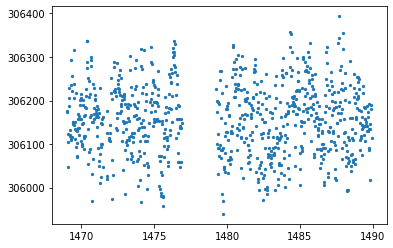

In [4]:
plt.scatter(data['time'], data['corrected flux'],s=5)

In [5]:
def inject_lightcurve(flux,time,depth,injected_time):
    return flux*(1-comet_curve(time,depth,injected_time,3.02715600e-01, 3.40346173e-01))

In [6]:
depth = 10**np.random.uniform(-4, -2,1)[0]
time_range = data["time"][
data["time"].between(
data["time"].min() + 1, data["time"].max() - 1, inclusive=False
)
].reset_index(
drop=True
)  # resets index so consistency is kept when working with indices
injected_time_index, injected_time = random.choice(list(enumerate(time_range)))

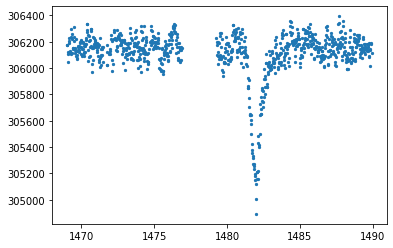

In [7]:
data['injected_comet_flux'] = inject_lightcurve(data['corrected flux'],data['time'],depth,1482)
plt.scatter(data['time'],data['injected_comet_flux'],s=5)

---

## Generating lightcurves

In [8]:
import os
from tqdm import tqdm

In [9]:
lc_paths = random.sample(os.listdir('/storage/astro2/phrdhx/tesslcs/tesslcs_sector_6_104/tesslcs_tmag_5_6/'),100)

In [10]:
depths = []
mags = []
recovered_depth = []
results_for_binning = []
recovered_or_not = []
filename = []
for i in tqdm(lc_paths):
    filename.append(i)
    data, lc_info = import_XRPlightcurve(os.path.join('/storage/astro2/phrdhx/tesslcs/tesslcs_sector_6_104/tesslcs_tmag_5_6/',i), sector=6,return_type='pandas')

    depth = 10**np.random.uniform(-4, -2,1)[0]
    depths.append(depth)
    mags.append(lc_info[3])
    time_range = data["time"][
    data["time"].between(
    data["time"].min() + 1, data["time"].max() - 1, inclusive=False
    )
    ].reset_index(
    drop=True
    )  # resets index so consistency is kept when working with indices
    injected_time_index, injected_time = random.choice(list(enumerate(time_range)))


    ## comet model
    data['injected_dip_flux'] = data['corrected flux']*(1-comet_curve(data['time'],depth, injected_time, 3.02715600e-01, 3.40346173e-01))
    try:
        os.makedirs('tests/')
    except FileExistsError:
        pass
    data.to_csv(f'tests/injected_lightcurve_{i.split(".pkl")[0]}.csv',index=False)

  9%|▉         | 9/100 [00:01<00:10,  8.54it/s]


KeyboardInterrupt: 

---

In [ ]:
cd ..

In [ ]:
from analysis_tools_cython import *
import random

In [ ]:
path = 'tests/'
to_import = random.sample(os.listdir(path),100)

In [ ]:
for i in to_import[70:]:
    data = pd.read_csv(os.path.join(path,i))
    data = Table.from_pandas(data)
    data = data[['time','injected_dip_flux','quality','flux error']]
    plt.title(f"TIC {i.split('_')[-1].split('.csv')[0]}")
    results, data_arrays = processing(data,'.',method='median')
    plt.scatter(data['time'],normalise_flux(data['injected_dip_flux']),s=10)
    plt.scatter(data_arrays[0],data_arrays[1],s=10,alpha=0.6)
    
    plt.show()

---

In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

In [3]:
# for filename in os.listdir('tests/'):
#     data = pd.read_csv(os.path.join('tests/',filename))
#     data = data[['time','injected_dip_flux','quality', 'flux error']]
#     plt.scatter(data['time'],data['injected_dip_flux'])
#     break

### 5 halfwidth + background subtraction

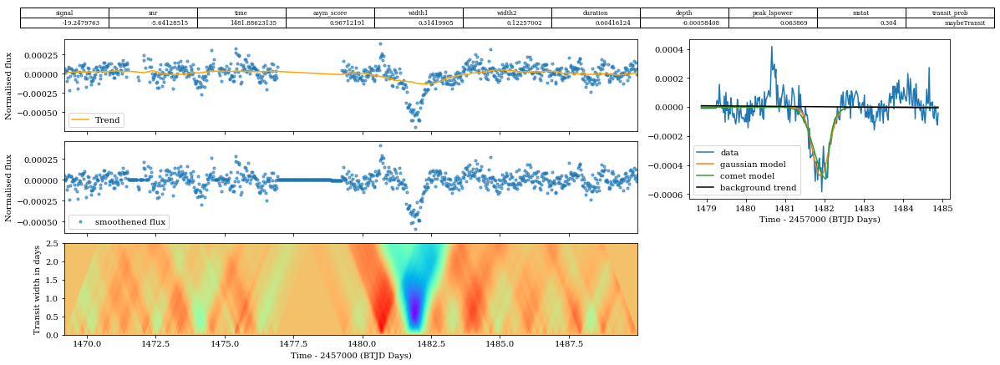

TIC309704722 -19.2479763 -5.64128515 1481.88623135 0.96712191 0.31419905 0.12257002 0.60416124 -0.00058408 0.063869 0.304 maybeTransit


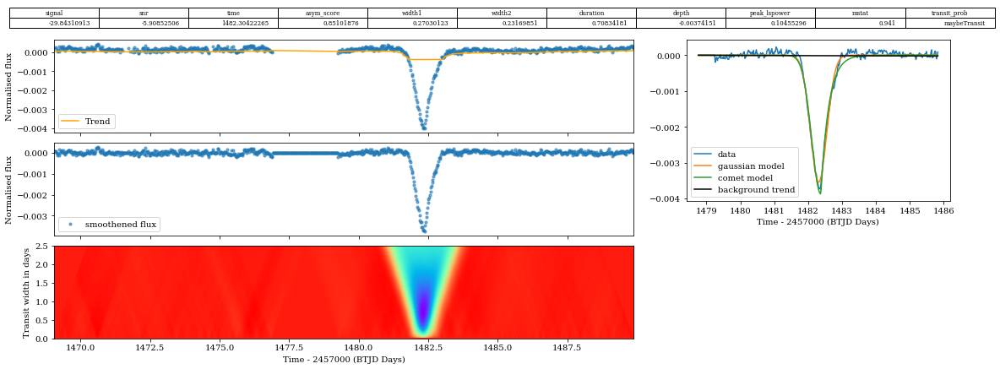

TIC238034693 -29.84310913 -5.90852506 1482.30422265 0.85101876 0.27030123 0.23169851 0.70834181 -0.00374151 0.10455296 0.941 maybeTransit


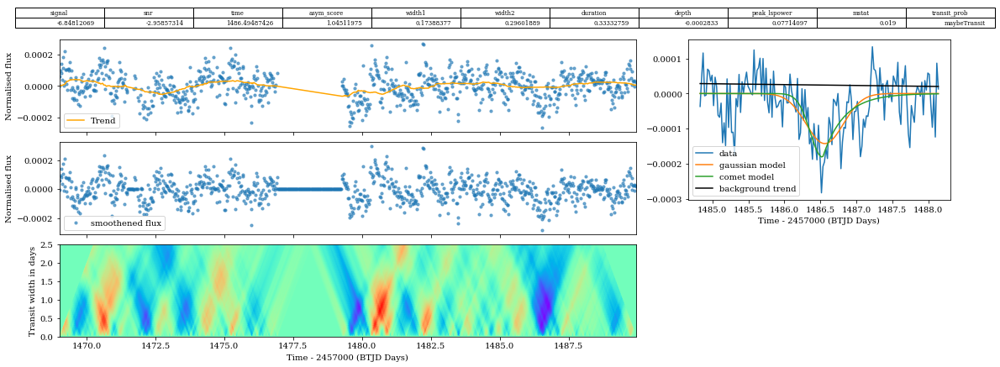

TIC710290434 -6.84812069 -2.95857314 1486.49487426 1.04511975 0.17388377 0.29601889 0.33332759 -0.0002833 0.07714097 0.019 maybeTransit


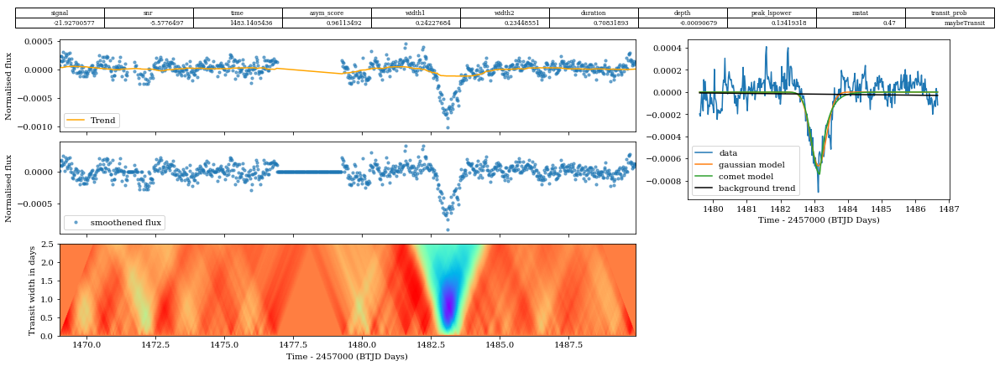

TIC388901462 -21.92700577 -5.5776497 1483.1405436 0.96113492 0.24227684 0.23448551 0.70831893 -0.00090679 0.13419318 0.47 maybeTransit


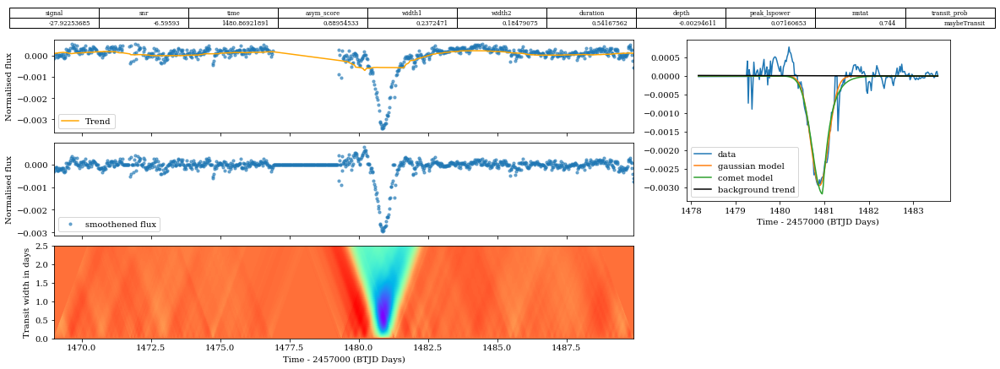

TIC79776871 -27.92253685 -6.59593 1480.86921891 0.88954533 0.2372471 0.18479075 0.54167562 -0.00294611 0.07160653 0.744 maybeTransit


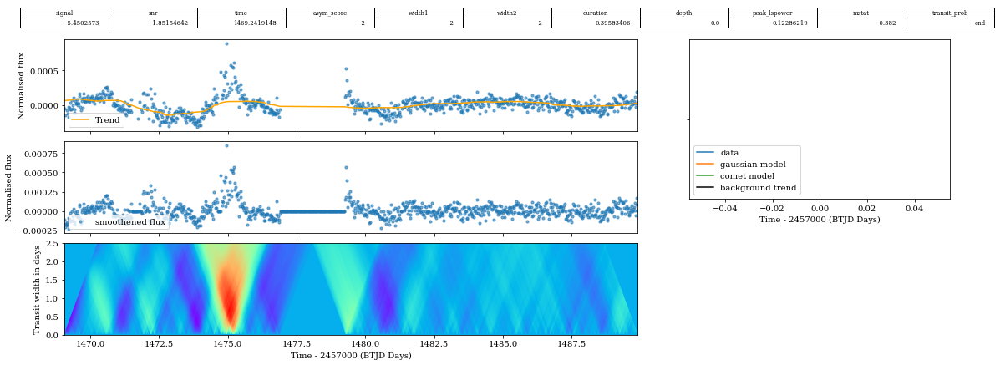

TIC238929567 -5.4502573 -1.85154642 1469.2419148 -2 -2 -2 0.39583406 0.0 0.12286219 -0.382 end


In [4]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()
    

### 5 halfwidth + subtraction off

In [1]:
cd .. 

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

No obvious way to change calc shape without stripping down the code, so re-importing and running best way here (for now).

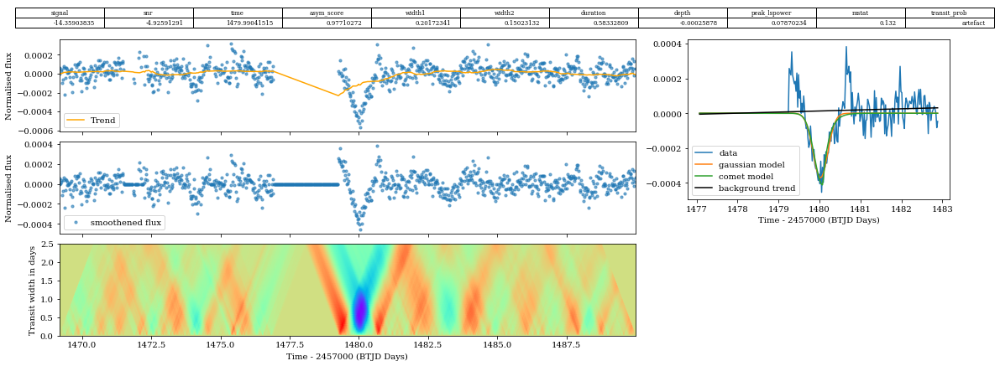

TIC309704722 -14.35903835 -4.92591291 1479.99041515 0.97710272 0.20172341 0.15023132 0.58332809 -0.00025878 0.07870234 0.132 artefact


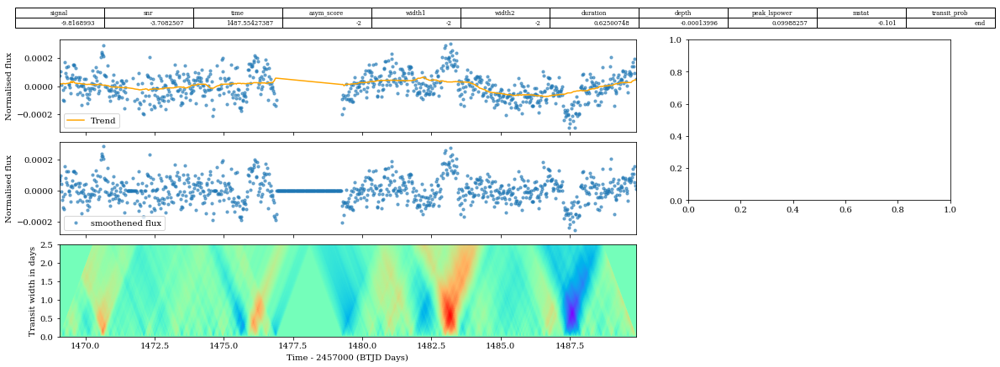

TIC238034693 -9.8168993 -3.7082507 1487.55427387 -2 -2 -2 0.62500748 -0.00013996 0.09988257 -0.101 end


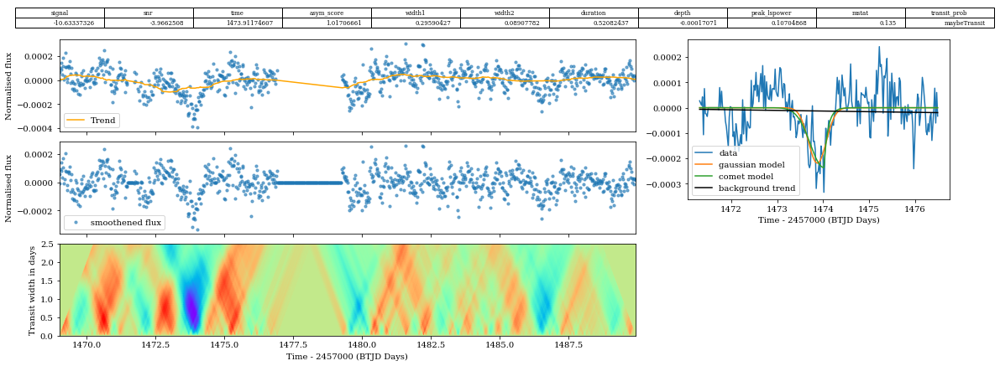

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.01706661 0.29590427 0.08907782 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


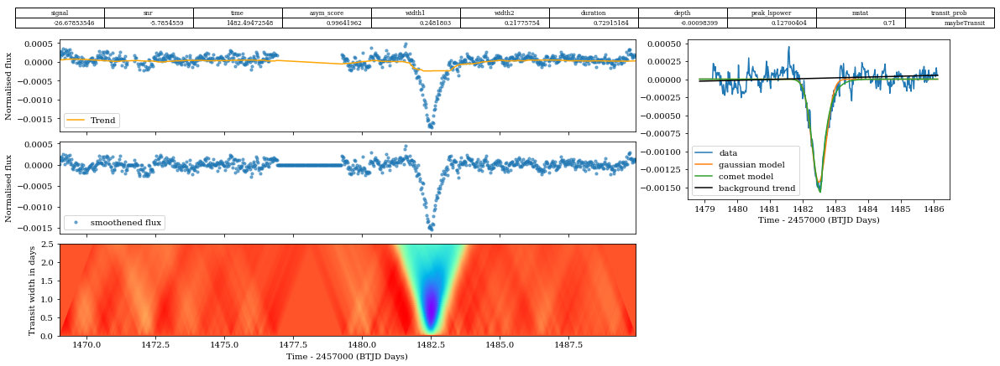

TIC388901462 -26.67853546 -5.7854559 1482.49472548 0.99641962 0.2481803 0.21775754 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


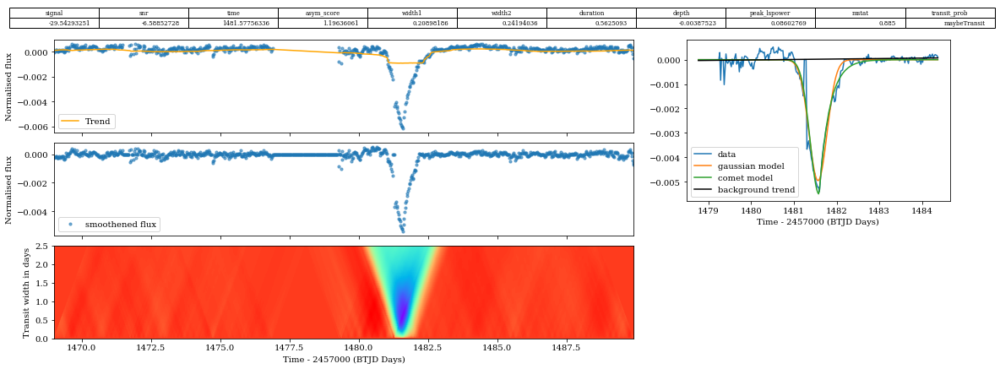

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.19636061 0.20898186 0.24194036 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


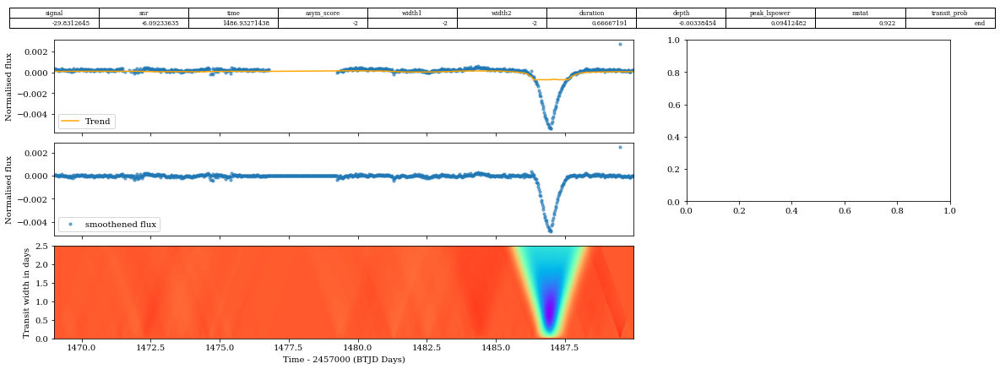

TIC53414713 -29.8312645 -6.09233635 1486.93271438 -2 -2 -2 0.66667191 -0.00338454 0.09412482 0.922 end


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()
    

### 3 halfwidth + background subtraction

In [1]:
cd .. 

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

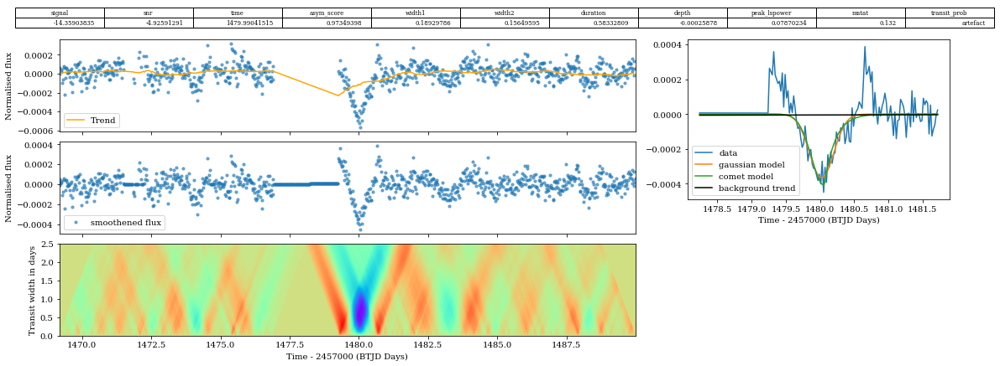

TIC309704722 -14.35903835 -4.92591291 1479.99041515 0.97349398 0.18929786 0.15649595 0.58332809 -0.00025878 0.07870234 0.132 artefact


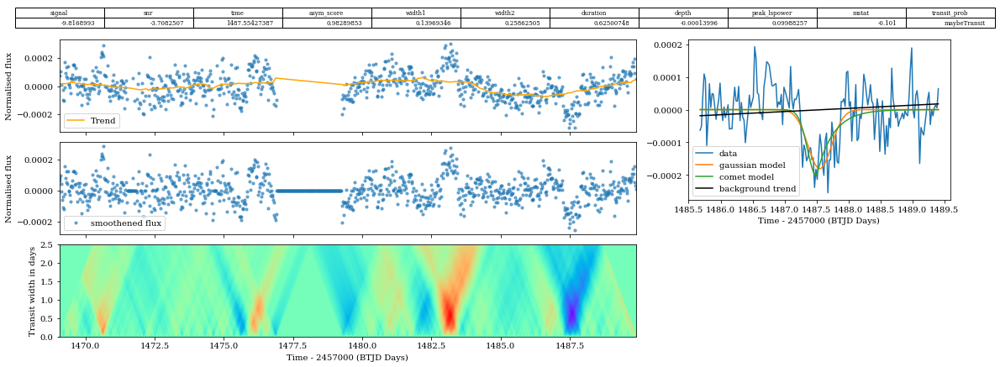

TIC238034693 -9.8168993 -3.7082507 1487.55427387 0.98289853 0.13969346 0.25862505 0.62500748 -0.00013996 0.09988257 -0.101 maybeTransit


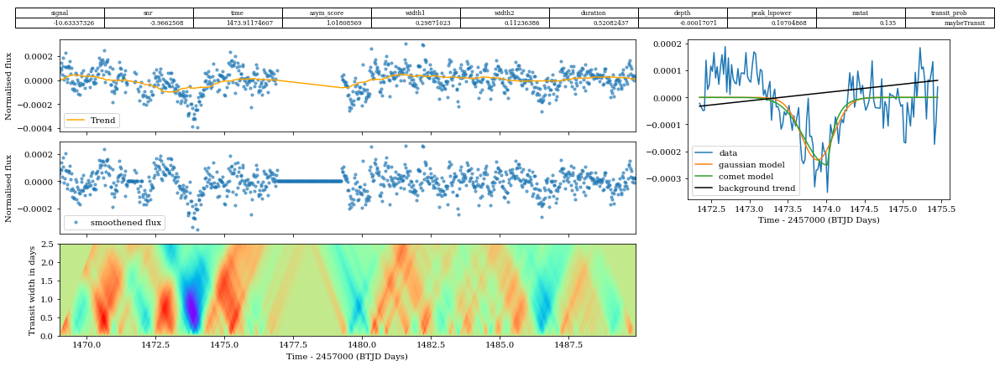

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.01808569 0.29871023 0.11236386 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


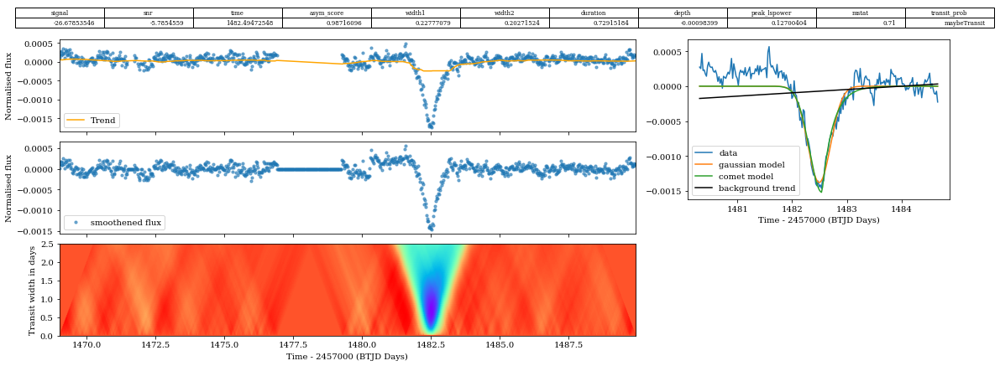

TIC388901462 -26.67853546 -5.7854559 1482.49472548 0.98716096 0.22777079 0.20271524 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


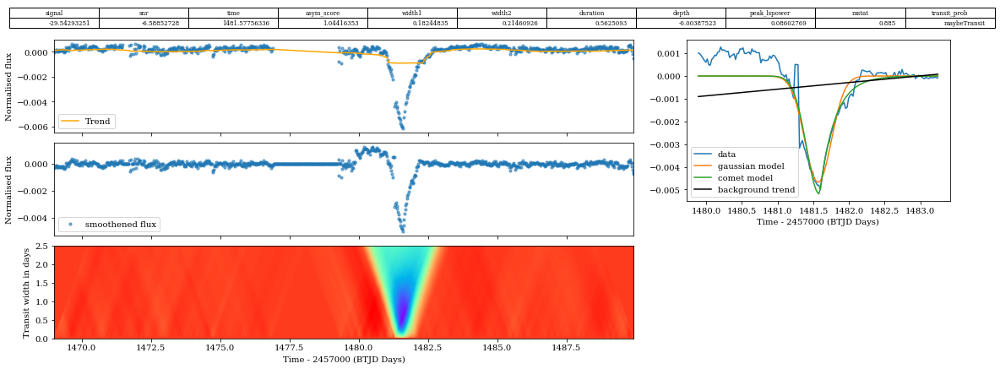

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.04416353 0.18244835 0.21460926 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


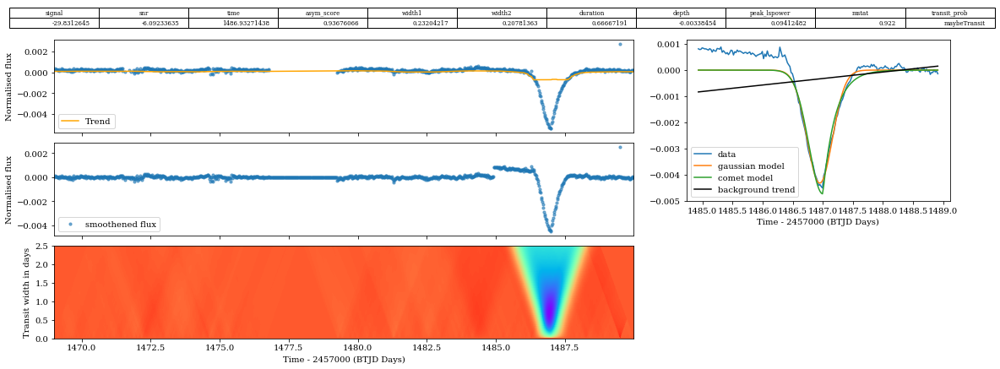

TIC53414713 -29.8312645 -6.09233635 1486.93271438 0.93676066 0.23204217 0.20781363 0.66667191 -0.00338454 0.09412482 0.922 maybeTransit


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()
    

---

### 3 halfwidth + no subtractions

In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

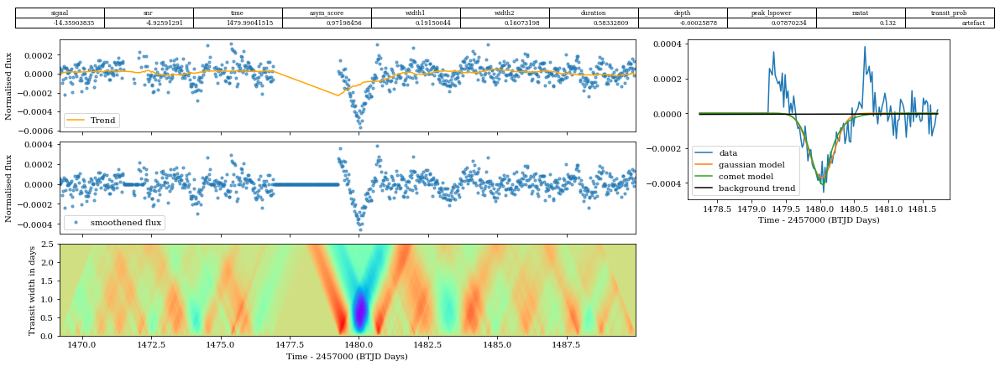

TIC309704722 -14.35903835 -4.92591291 1479.99041515 0.97198456 0.19150044 0.16073198 0.58332809 -0.00025878 0.07870234 0.132 artefact


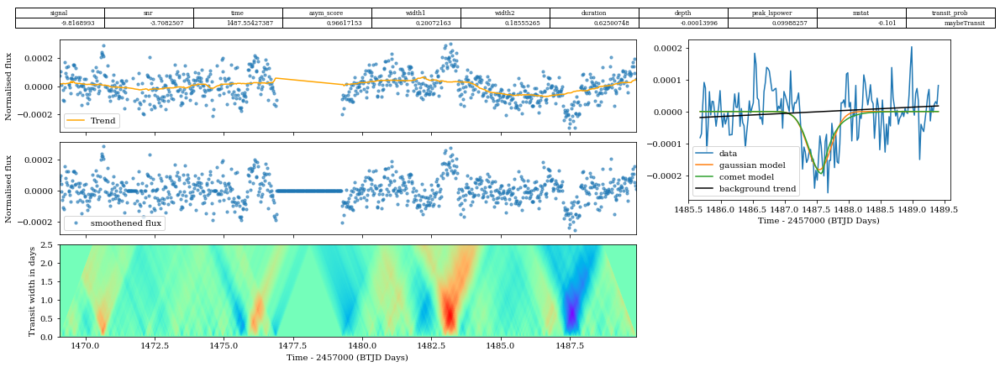

TIC238034693 -9.8168993 -3.7082507 1487.55427387 0.96617153 0.20072163 0.18555265 0.62500748 -0.00013996 0.09988257 -0.101 maybeTransit


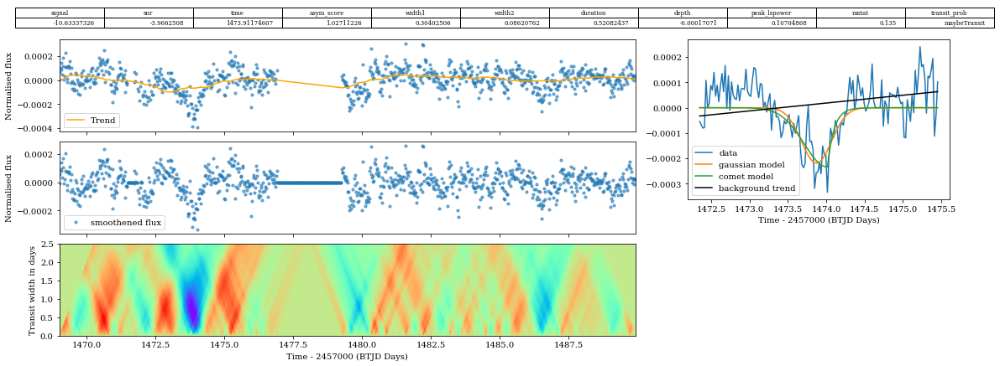

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.02711226 0.30402506 0.08620762 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


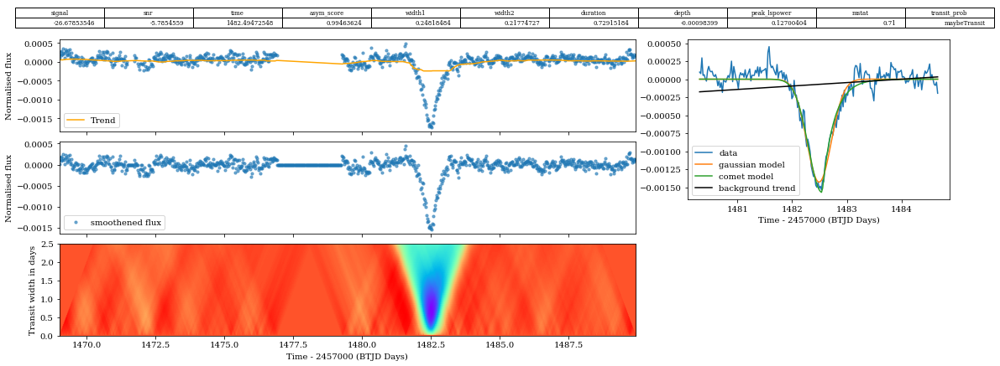

TIC388901462 -26.67853546 -5.7854559 1482.49472548 0.99463624 0.24818484 0.21774727 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


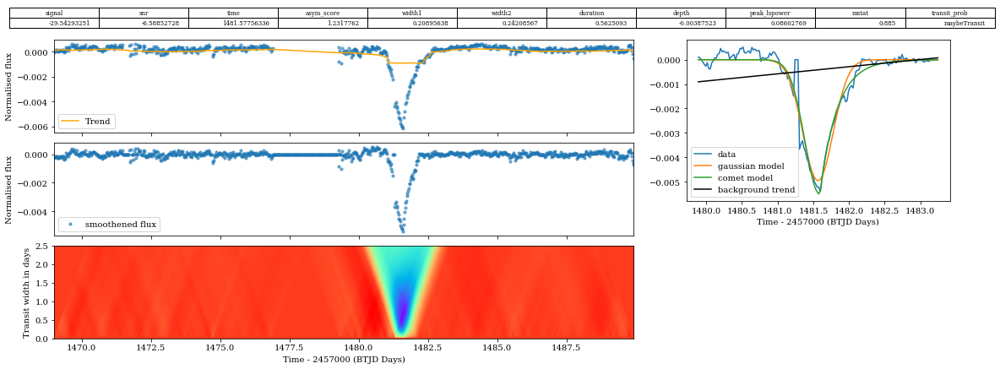

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.2317762 0.20895638 0.24208567 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


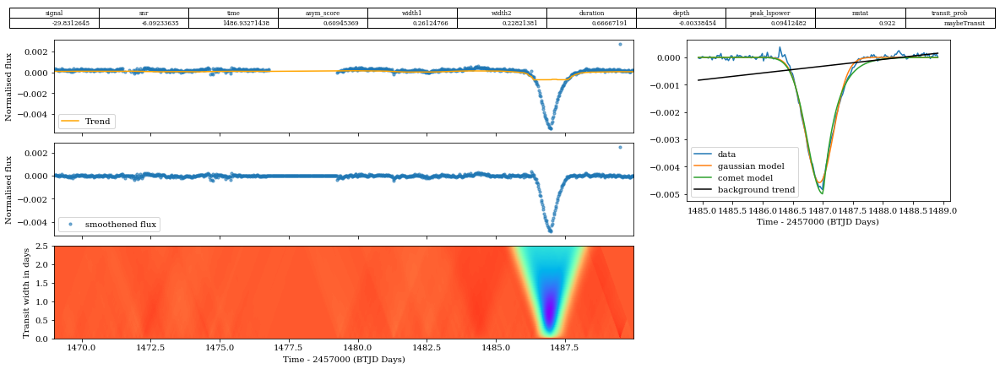

TIC53414713 -29.8312645 -6.09233635 1486.93271438 0.60945369 0.26124766 0.22821381 0.66667191 -0.00338454 0.09412482 0.922 maybeTransit


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()
    

---

### 2 halfwidth + subtractions

In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

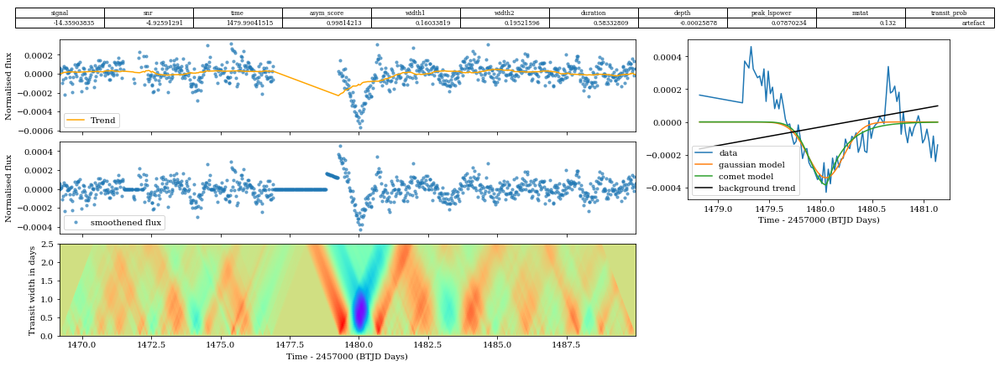

TIC309704722 -14.35903835 -4.92591291 1479.99041515 0.99814213 0.16033819 0.19521596 0.58332809 -0.00025878 0.07870234 0.132 artefact


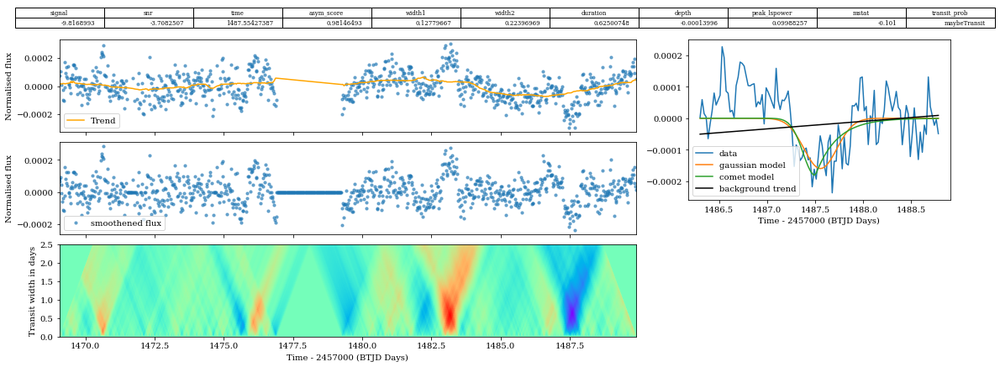

TIC238034693 -9.8168993 -3.7082507 1487.55427387 0.98146493 0.12779667 0.22396969 0.62500748 -0.00013996 0.09988257 -0.101 maybeTransit


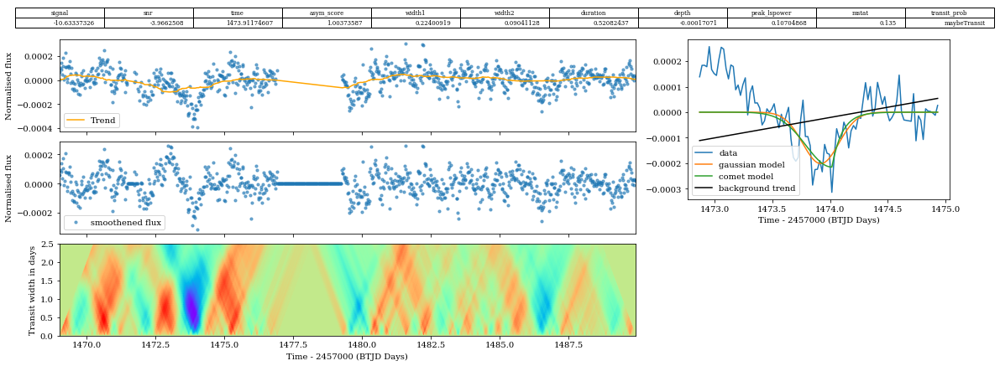

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.00373587 0.22400919 0.09041128 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


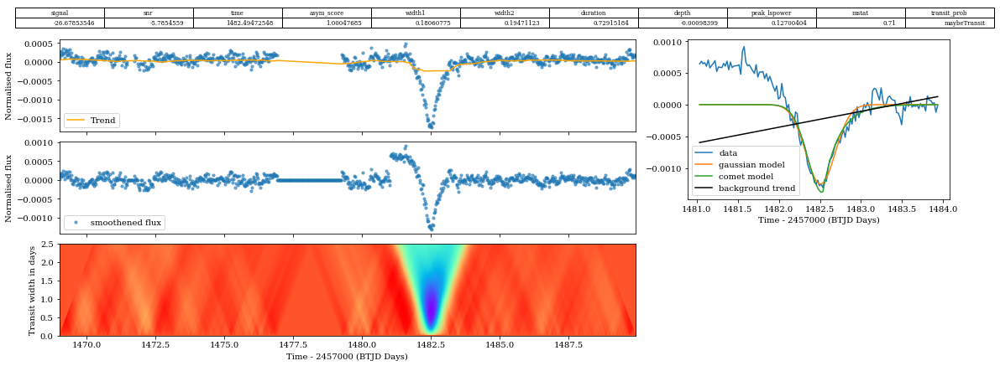

TIC388901462 -26.67853546 -5.7854559 1482.49472548 1.00047685 0.18060775 0.19471123 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


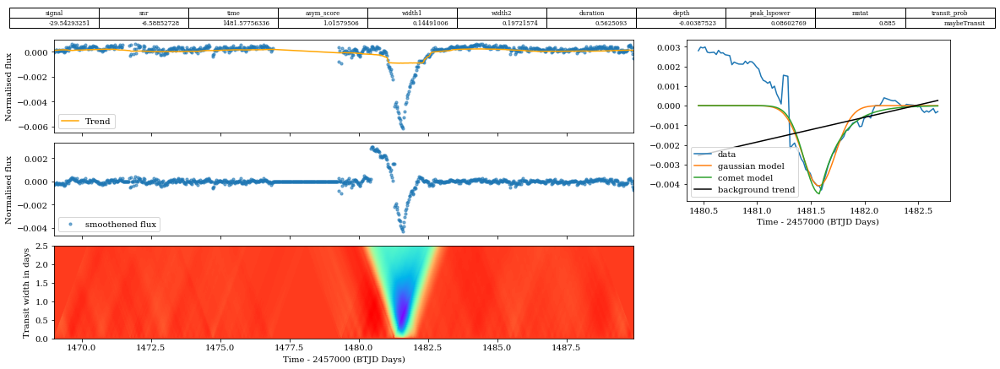

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.01579506 0.14491006 0.19721574 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


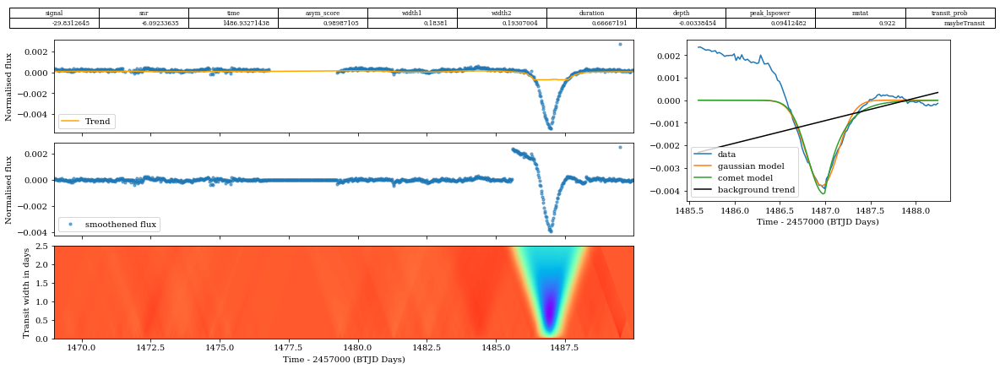

TIC53414713 -29.8312645 -6.09233635 1486.93271438 0.98987105 0.18381 0.19307004 0.66667191 -0.00338454 0.09412482 0.922 maybeTransit


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()
    

---

### 2 halfwidth + no subtractions

In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

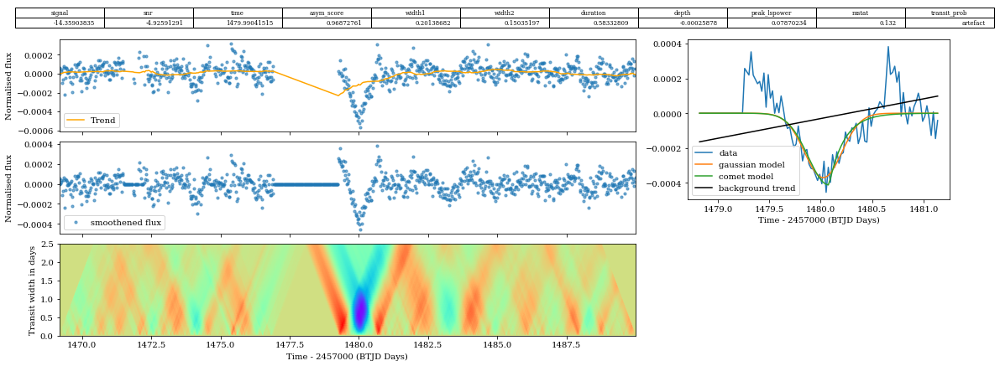

TIC309704722 -14.35903835 -4.92591291 1479.99041515 0.96872761 0.20138682 0.15035197 0.58332809 -0.00025878 0.07870234 0.132 artefact


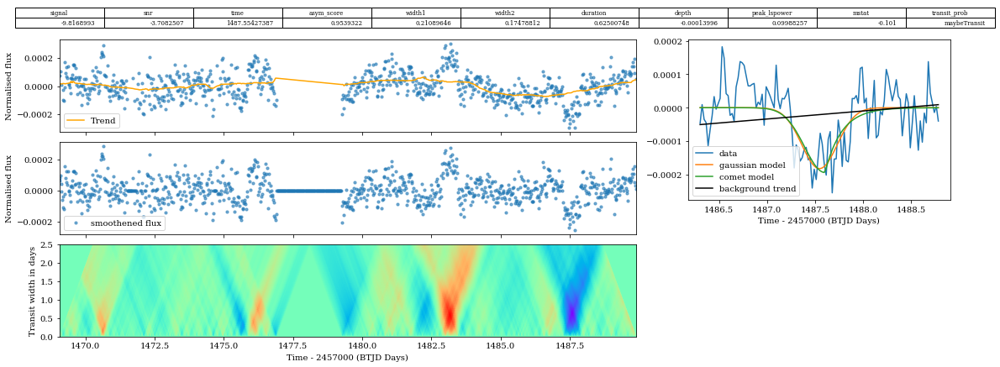

TIC238034693 -9.8168993 -3.7082507 1487.55427387 0.9539322 0.21089646 0.17478812 0.62500748 -0.00013996 0.09988257 -0.101 maybeTransit


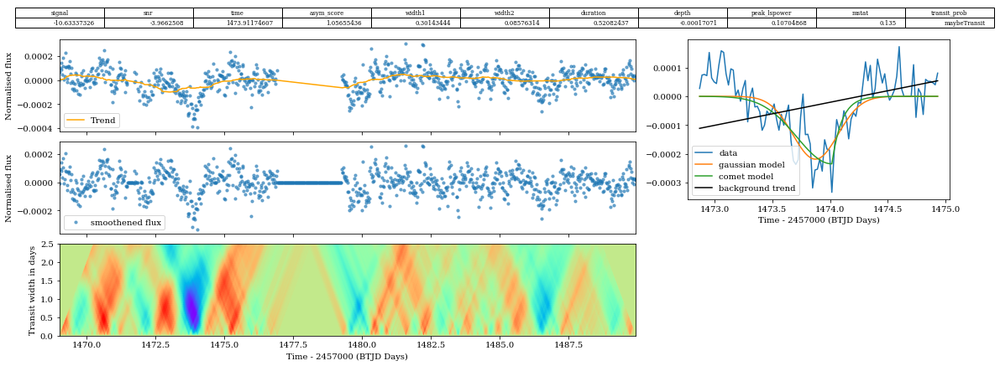

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.05655436 0.30143444 0.08576314 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


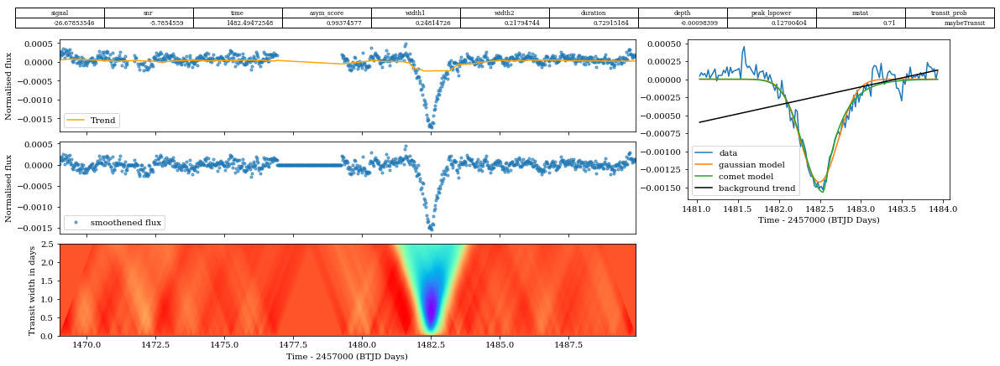

TIC388901462 -26.67853546 -5.7854559 1482.49472548 0.99374577 0.24814726 0.21794744 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


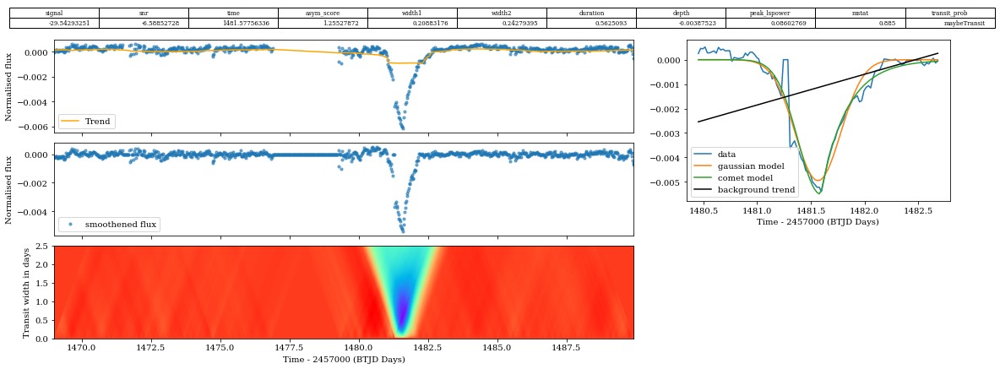

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.25527872 0.20883176 0.24279395 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


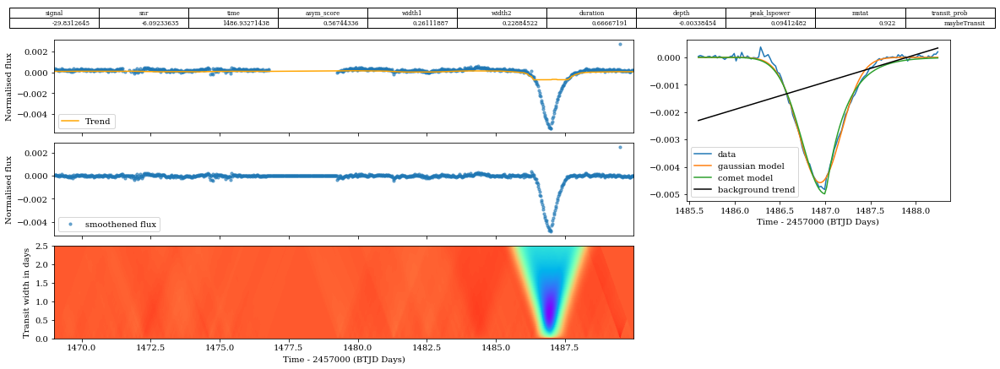

TIC53414713 -29.8312645 -6.09233635 1486.93271438 0.56744336 0.26111887 0.22884522 0.66667191 -0.00338454 0.09412482 0.922 maybeTransit


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()

---

### 1 halfwidth + subtractions

In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

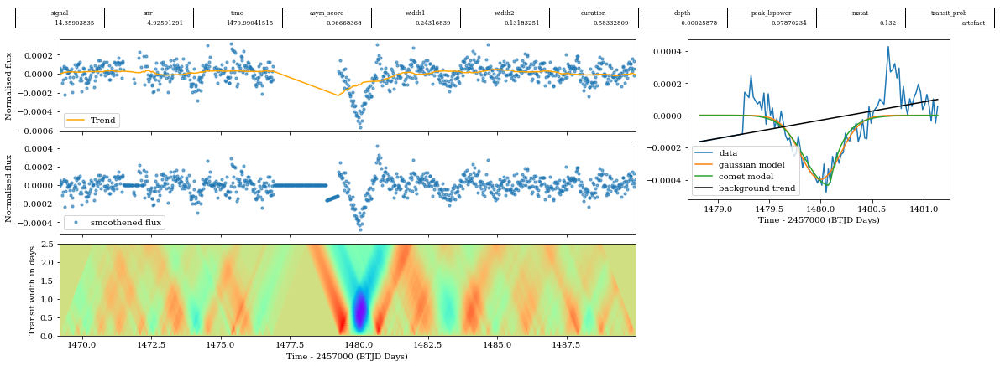

TIC309704722 -14.35903835 -4.92591291 1479.99041515 0.96668368 0.24316839 0.13183251 0.58332809 -0.00025878 0.07870234 0.132 artefact


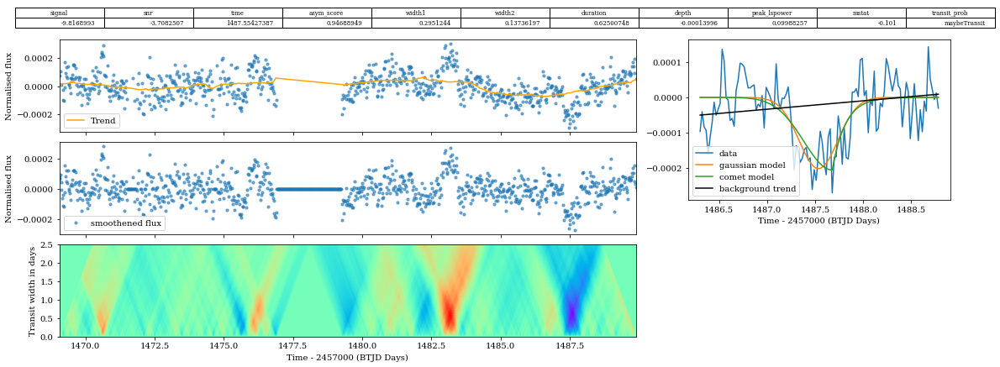

TIC238034693 -9.8168993 -3.7082507 1487.55427387 0.94688949 0.2951244 0.13736197 0.62500748 -0.00013996 0.09988257 -0.101 maybeTransit


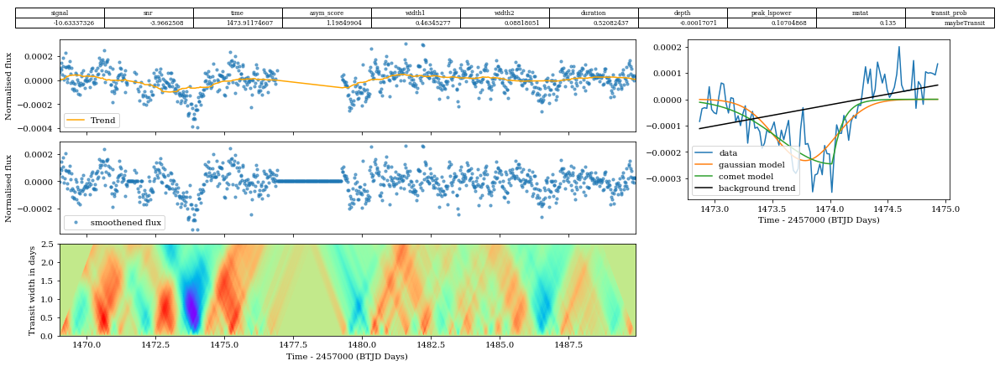

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.19849904 0.46345277 0.08818051 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


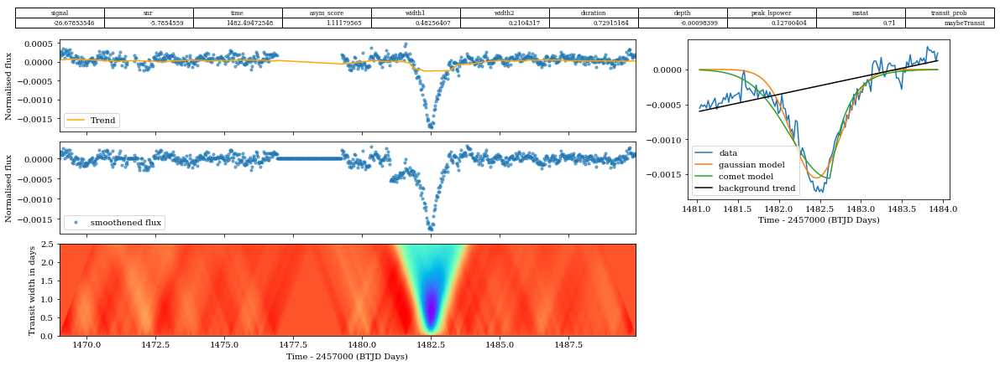

TIC388901462 -26.67853546 -5.7854559 1482.49472548 1.11179565 0.48256407 0.2104317 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


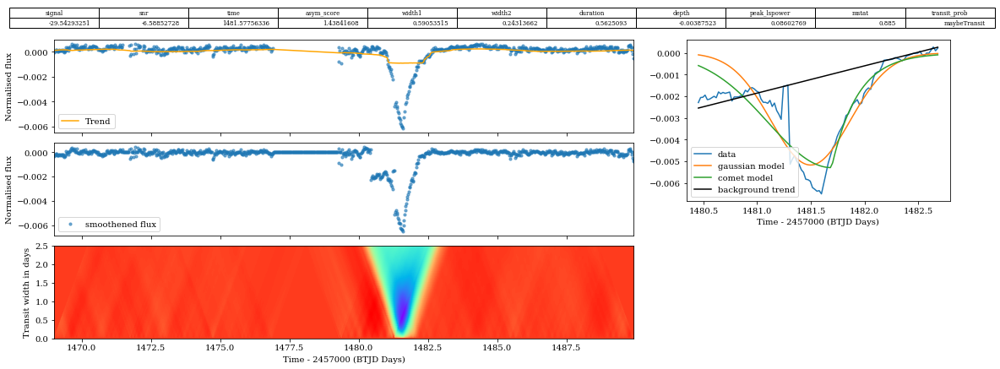

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.43841608 0.59053515 0.24313662 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


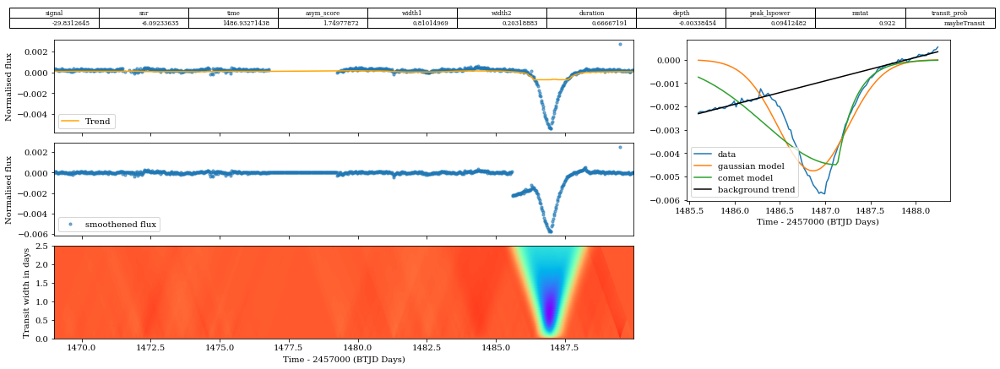

TIC53414713 -29.8312645 -6.09233635 1486.93271438 1.74977872 0.81014969 0.20318883 0.66667191 -0.00338454 0.09412482 0.922 maybeTransit


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()

---

### 1 halfwidth + no subtractions

In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

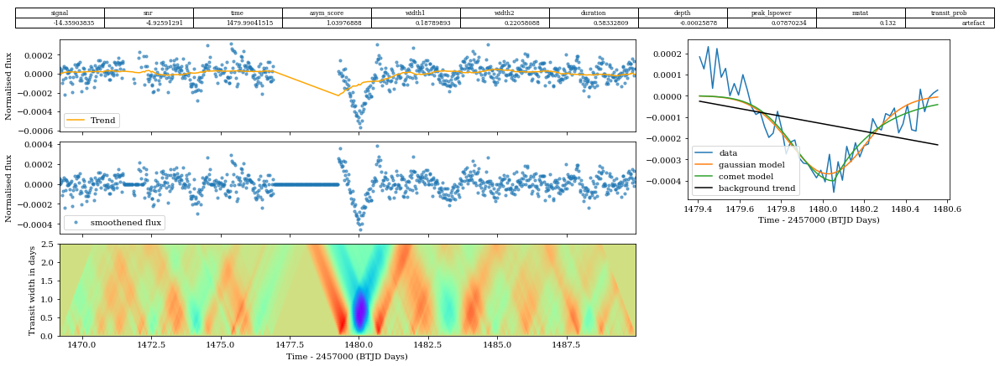

TIC309704722 -14.35903835 -4.92591291 1479.99041515 1.03976888 0.18789893 0.22058088 0.58332809 -0.00025878 0.07870234 0.132 artefact


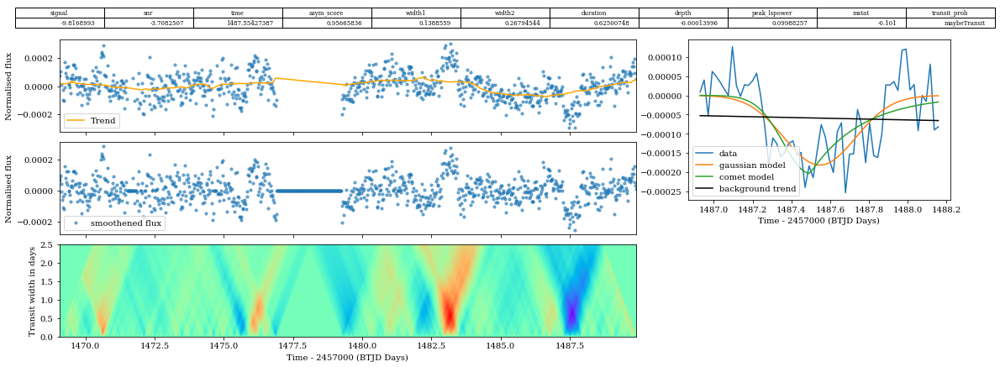

TIC238034693 -9.8168993 -3.7082507 1487.55427387 0.95665836 0.1388559 0.26794544 0.62500748 -0.00013996 0.09988257 -0.101 maybeTransit


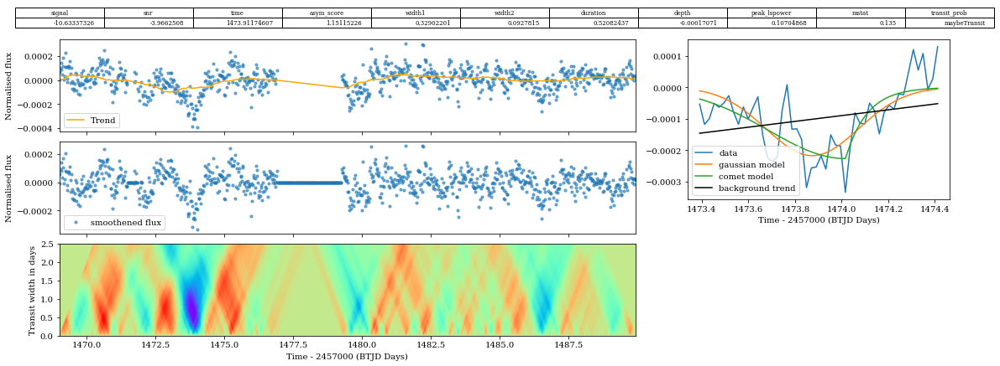

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.15115226 0.32902201 0.0927815 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


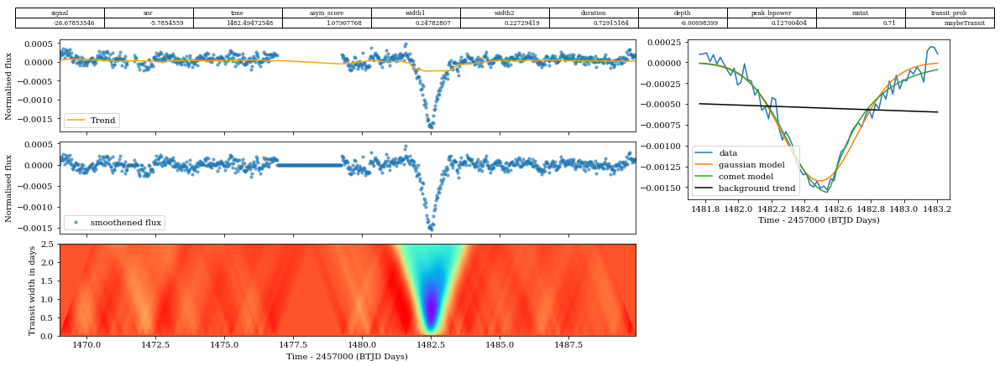

TIC388901462 -26.67853546 -5.7854559 1482.49472548 1.07907768 0.24782807 0.22729419 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


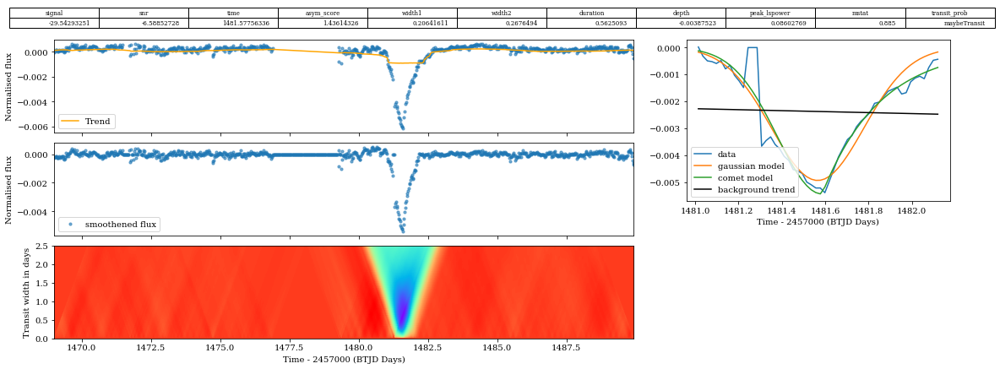

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.43614326 0.20641611 0.2676494 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


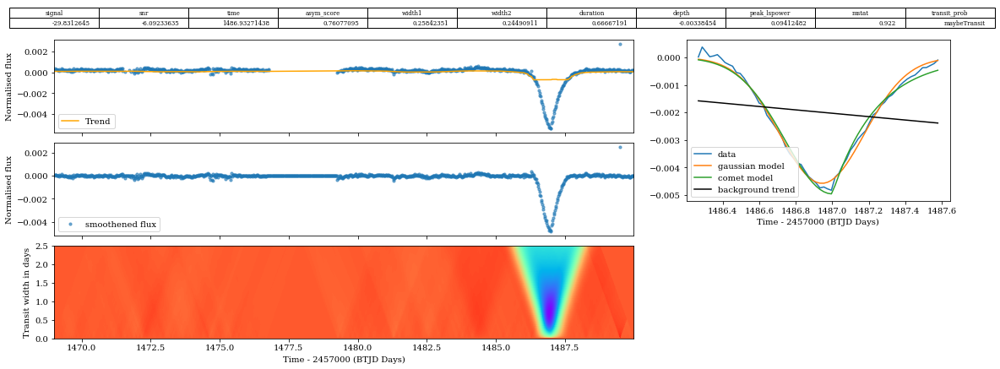

TIC53414713 -29.8312645 -6.09233635 1486.93271438 0.76077095 0.25842351 0.24490911 0.66667191 -0.00338454 0.09412482 0.922 maybeTransit


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()

---

### 7 halfwidths + subtraction

In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

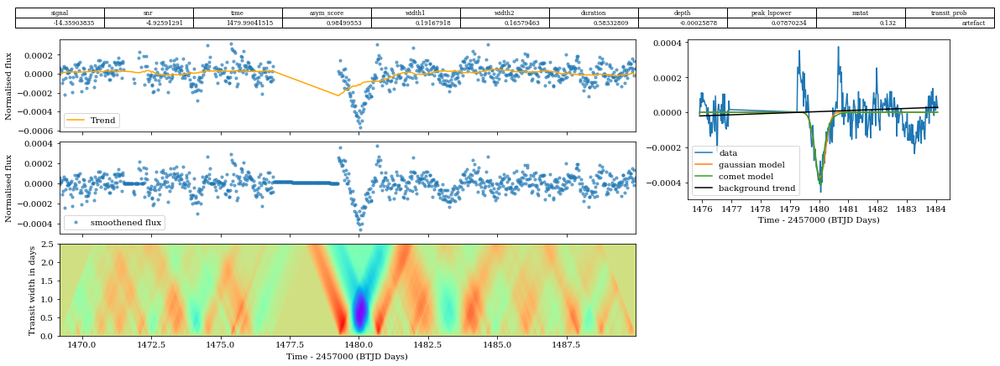

TIC309704722 -14.35903835 -4.92591291 1479.99041515 0.98499553 0.19167918 0.16579463 0.58332809 -0.00025878 0.07870234 0.132 artefact


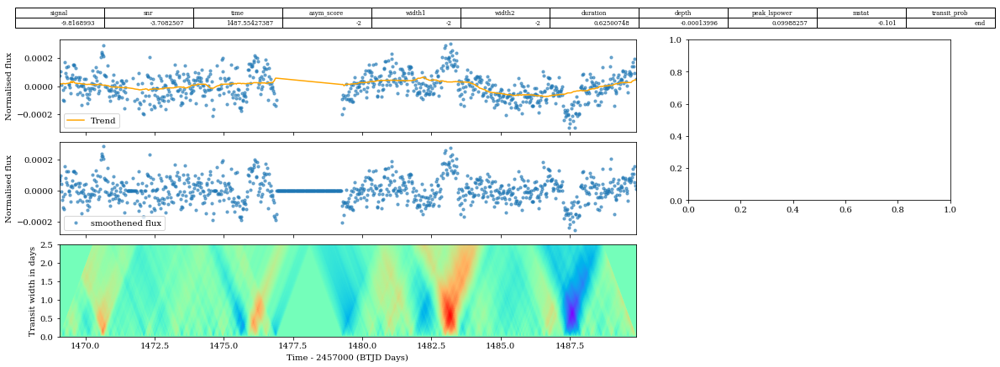

TIC238034693 -9.8168993 -3.7082507 1487.55427387 -2 -2 -2 0.62500748 -0.00013996 0.09988257 -0.101 end


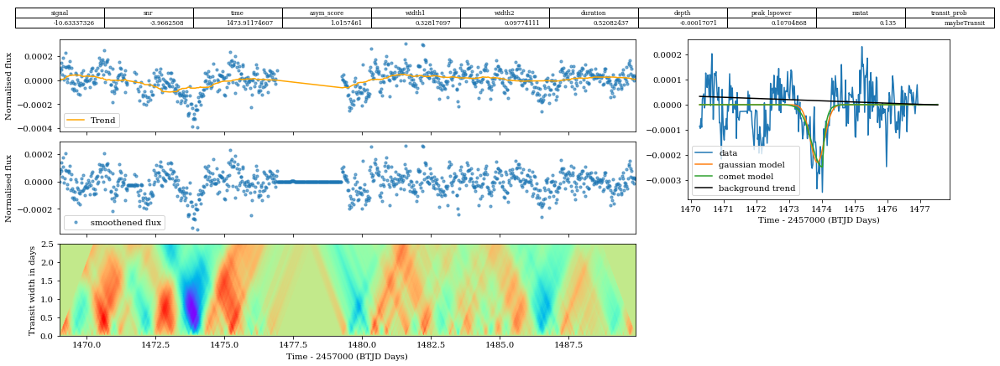

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.0157461 0.32817097 0.09774111 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


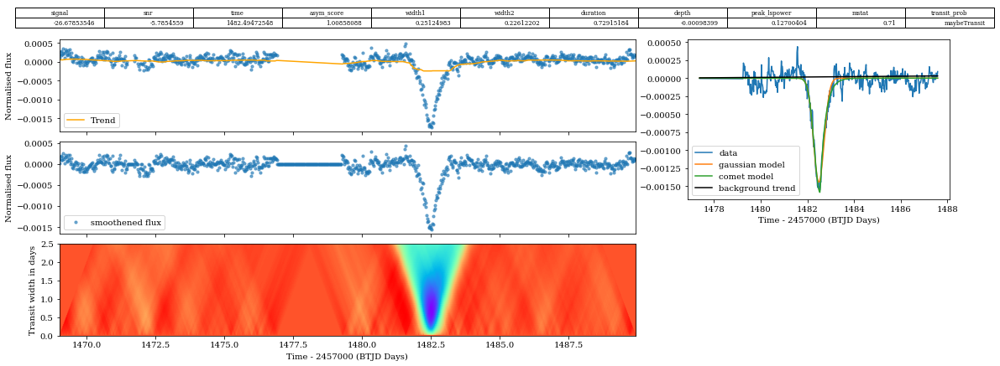

TIC388901462 -26.67853546 -5.7854559 1482.49472548 1.00858088 0.25124983 0.22612202 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


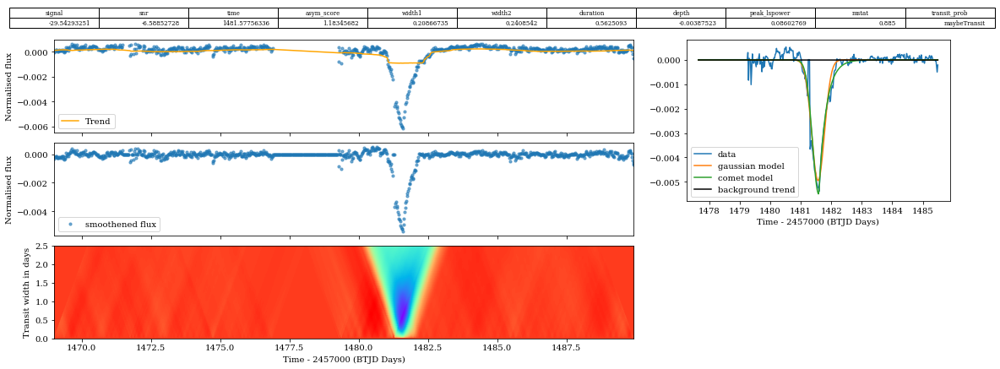

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.18345682 0.20866735 0.2408542 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


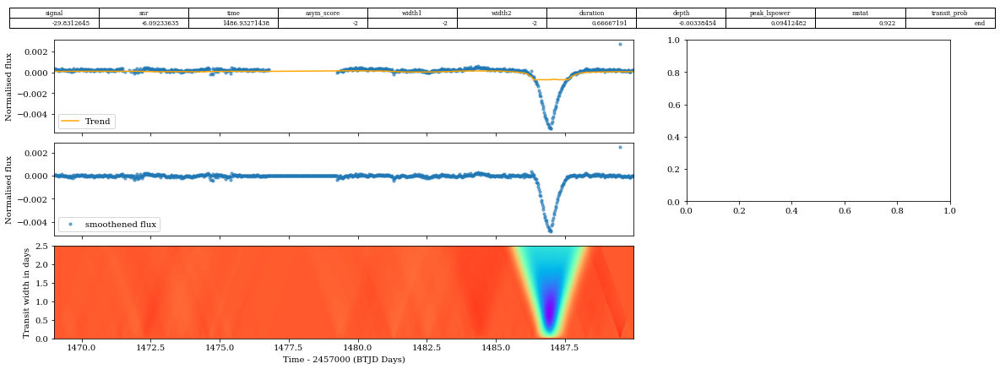

TIC53414713 -29.8312645 -6.09233635 1486.93271438 -2 -2 -2 0.66667191 -0.00338454 0.09412482 0.922 end


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()

---

### 7 halfwidths + no subtraction

In [1]:
cd ..

/home/astro/phrdhx/automated_exocomet_hunt


In [2]:
from analysis_tools_cython import *

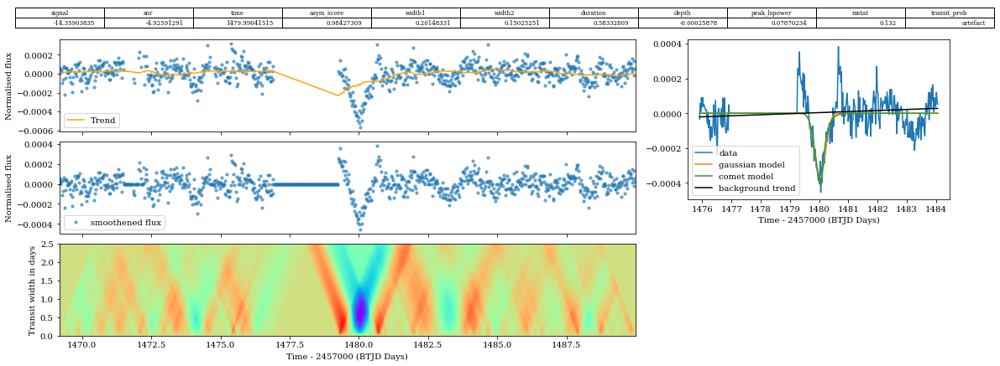

TIC309704722 -14.35903835 -4.92591291 1479.99041515 0.98427309 0.20148331 0.15025251 0.58332809 -0.00025878 0.07870234 0.132 artefact


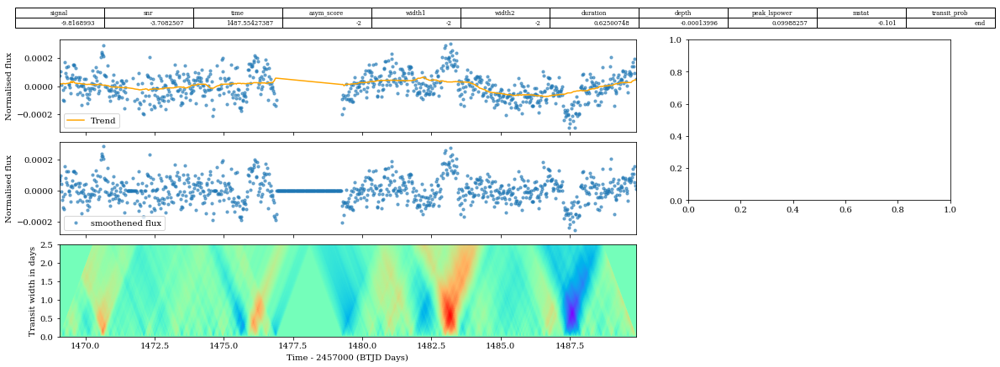

TIC238034693 -9.8168993 -3.7082507 1487.55427387 -2 -2 -2 0.62500748 -0.00013996 0.09988257 -0.101 end


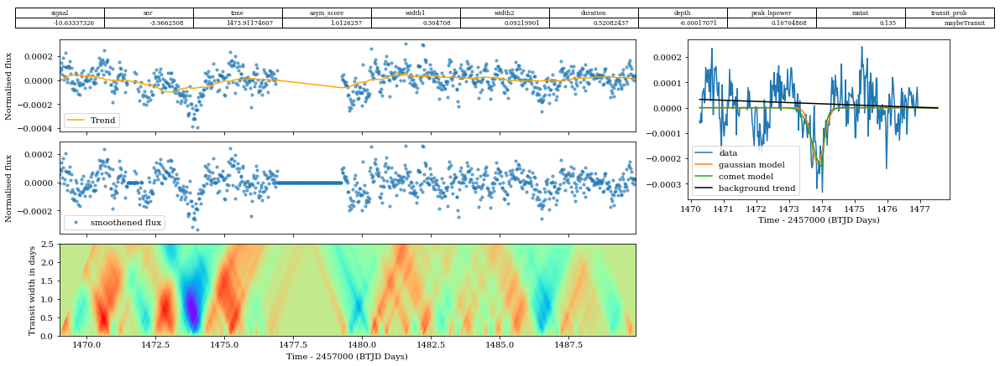

TIC710290434 -10.63337326 -3.9662508 1473.91174607 1.0126257 0.304708 0.09219901 0.52082437 -0.00017071 0.10704868 0.135 maybeTransit


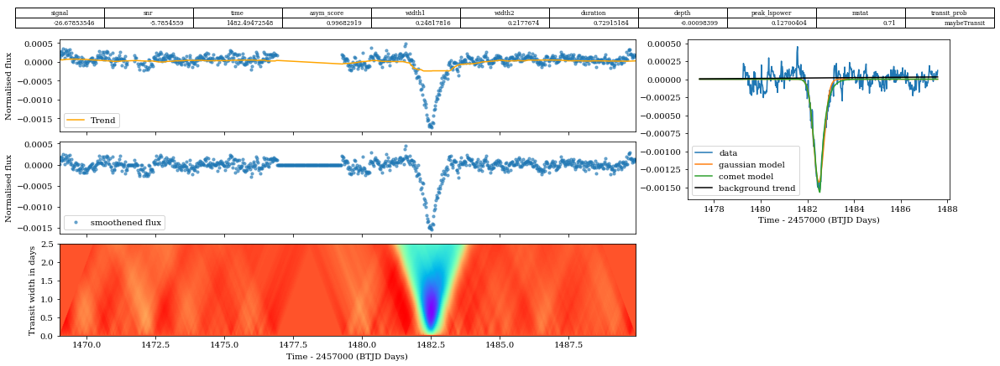

TIC388901462 -26.67853546 -5.7854559 1482.49472548 0.99682919 0.24817816 0.2177674 0.72915184 -0.00098399 0.12700404 0.71 maybeTransit


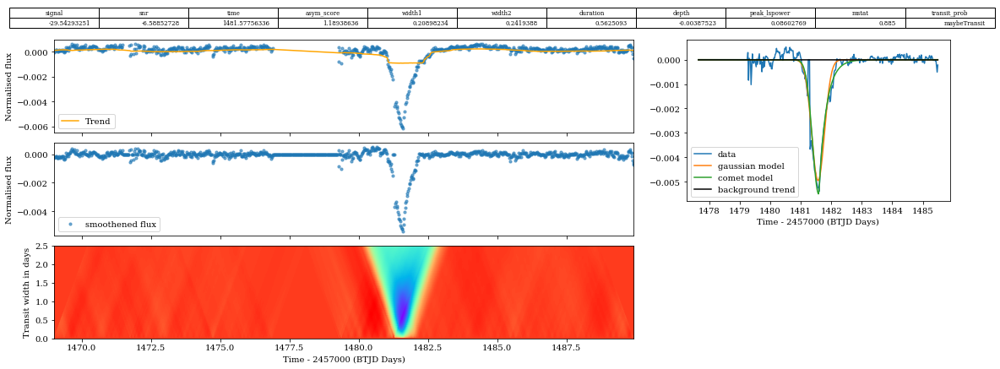

TIC79776871 -29.54293251 -6.58852728 1481.57756336 1.18938636 0.20898234 0.2419388 0.5625093 -0.00387523 0.08602769 0.885 maybeTransit


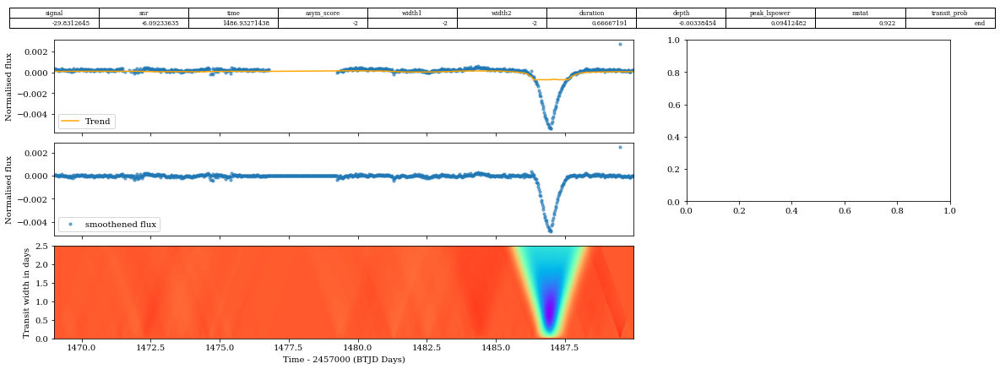

TIC53414713 -29.8312645 -6.09233635 1486.93271438 -2 -2 -2 0.66667191 -0.00338454 0.09412482 0.922 end


In [3]:
for filename in os.listdir('tests/')[0:6]:
    data = pd.read_csv(os.path.join('tests/',filename))
    data = data[['time','injected_dip_flux','quality','flux error']]
    results, data_arrays = processing(data, f_path =f"TIC{filename.split('_')[-1].split('.csv')[0]}", method='median',make_plots=True)
    print(results)
    #plt.scatter(data['time'], data['injected_dip_flux'],s=8)
    plt.show()

In [51]:
flat_flux = flatten(data['time'],data['injected_comet_flux'],method='median')

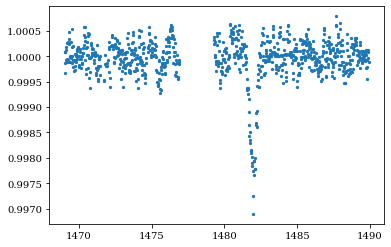

In [53]:
plt.scatter(data['time'],flat_flux,s=5,label='injected')


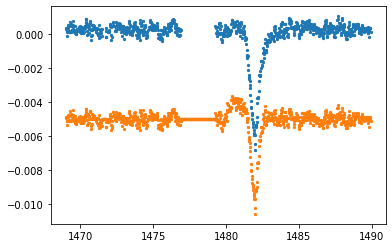

In [20]:
plt.scatter(data['time'],normalise_flux(data['injected_comet_flux']),s=5,label='injected')
plt.scatter(return_data[0],return_data[1]-0.005,s=5,label='post processed')

In [22]:
return_data[1].min()

-0.005565521887115377

In [23]:
results

'. -28.49874115 -6.12470217 1481.9323475 0.95912536 0.24345305 0.20422087 0.62500809 -0.00381883 0.0842846 0.775 maybeTransit'

In [14]:
process = data[['time','injected_comet_flux','quality','flux error']]

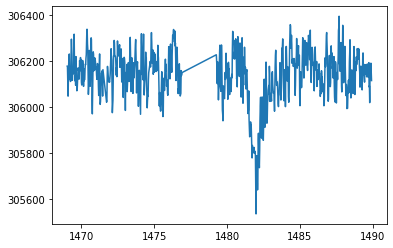

In [15]:
plt.plot(process['time'],process['injected_comet_flux'])

In [16]:
results, return_data = processing(process,f_path='.',method=None)

In [17]:
process

time,injected_comet_flux,quality,flux error
float64,float64,int64,float64
1469.01541836009,306176.74812936457,0,15.662630906564631
1469.0362523010058,306173.0285425323,0,15.66103765212688
1469.0570862439056,306105.1911014174,0,15.660047487320014
1469.0779201888045,306046.5866011865,0,15.660043196001686
1469.0987541356749,306121.9300946859,0,15.661501645234758
1469.1195880844425,306186.85345892934,0,15.66486985499481
1469.140422034993,306204.7834086489,0,15.665210689299933
1469.16125598717,306229.6597836364,0,15.664207820290509
1469.1820899407771,306132.94070096815,0,15.662223562807055


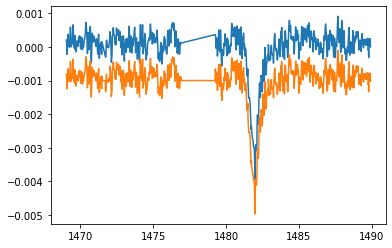

In [18]:
plt.plot(test_data['time'],normalise_flux(test_data['injected_comet_flux']))
plt.plot(return_data[0], return_data[1]-0.001)

In [19]:
results

'. -26.11315918 -4.87930531 1481.95318105 1.17525949 0.3175315 0.36489816 0.87501132 -0.00230911 0.1464487 0.696 maybeTransit'

In [20]:
test_data[test_data.colnames[1]]

AttributeError: 'DataFrame' object has no attribute 'colnames'

---

In [21]:
from wotan import flatten

In [22]:
data, _ = import_XRPlightcurve('/storage/astro2/phrdhx/tesslcs/tesslcs_sector_6_104/tesslcs_tmag_7_8/tesslc_100531312.pkl',sector=6)

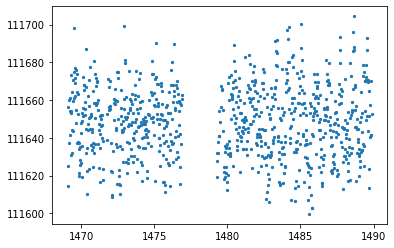

In [23]:
plt.scatter(data['time'],data['corrected flux'],s=5)

In [24]:
flattened = flatten(data['time'],data['corrected flux'],method='median',return_trend=False)

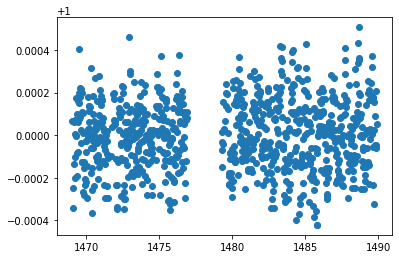

In [25]:
plt.scatter(data['time'],flattened)

In [26]:
t = Table()
t['time'] = data['time']
t['flux'] = flattened - np.ones(len(flattened))
t['quality'] = data['quality']
t['flux_error'] = data['flux error']

In [27]:
t, flux, quality, real, error = clean_data(t)
flux *= real

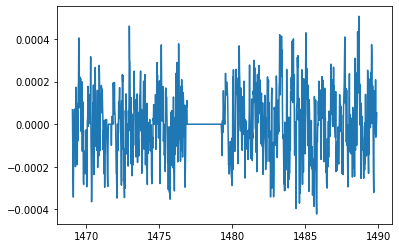

In [28]:
plt.plot(t,flux)

---

## Gridspec layout

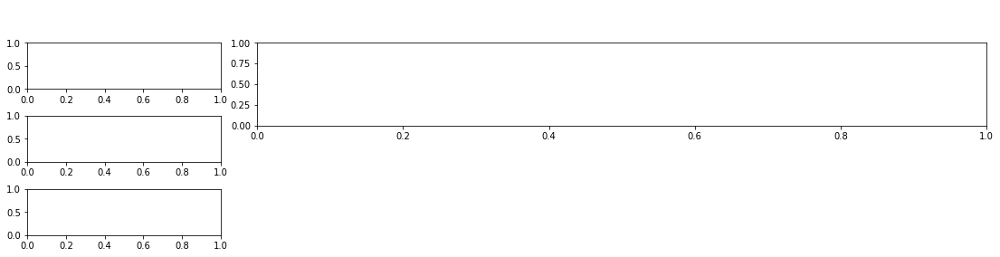

In [6]:
fig = plt.figure(figsize=(19,8))
gs1 = fig.add_gridspec(22, 13,hspace=0.9,wspace=0.9)
ax0 = plt.subplot(gs1[0:1,:]) # table of stats
ax0.axis('off')

ax1 = plt.subplot(gs1[2:5,:3]) # flux before + smoothing function
ax2 = plt.subplot(gs1[6:9,:3],sharex=ax1) # flux after
ax3 = plt.subplot(gs1[2:7,3:]) # transit shape
ax4 = plt.subplot(gs1[10:13,:3]) # imshow


In [25]:
data, _ = import_lightcurve('betapic/fits/hlsp_tess-spoc_tess_phot_0000000270577175-s0006_tess_v1_lc.fits')

In [8]:
hdulist = fits.open('betapic/fits/hlsp_tess-spoc_tess_phot_0000000270577175-s0006_tess_v1_lc.fits')

In [12]:
Table(hdulist[1].data)

TIME,TIMECORR,CADENCENO,SAP_FLUX,SAP_FLUX_ERR,SAP_BKG,SAP_BKG_ERR,PDCSAP_FLUX,PDCSAP_FLUX_ERR,QUALITY,PSF_CENTR1,PSF_CENTR1_ERR,PSF_CENTR2,PSF_CENTR2_ERR,MOM_CENTR1,MOM_CENTR1_ERR,MOM_CENTR2,MOM_CENTR2_ERR,POS_CORR1,POS_CORR2
float64,float32,int32,float32,float32,float32,float32,float32,float32,int32,float64,float32,float64,float32,float64,float32,float64,float32,float32,float32
1468.2833202550494,0.0015437395,11559,5440095.0,64.05369,11814.139,6.1606474,nan,nan,8,nan,nan,nan,nan,1661.2294837793688,1.2087127e-05,619.0105923347664,5.3862706e-05,nan,nan
1468.3041536038627,0.0015437636,11560,5441052.5,64.05927,11819.849,6.1587396,5507612.0,64.86285,0,nan,nan,nan,nan,1661.2287367724061,1.20849e-05,619.0115738272647,5.38732e-05,0.01709123,0.04153716
1468.3249869523263,0.0015437873,11561,5440696.5,64.05729,11821.125,6.1617174,5507246.5,64.86083,0,nan,nan,nan,nan,1661.228034654514,1.2085667e-05,619.0120182342612,5.3865642e-05,0.016121373,0.041930735
1468.34582030044,0.0015438107,11562,5440802.5,64.05946,11831.08,6.165083,5507478.5,64.86304,0,nan,nan,nan,nan,1661.2286157609162,1.2086111e-05,619.0097922815122,5.3873297e-05,0.016758189,0.040247127
1468.3666536480885,0.0015438336,11563,5441807.5,64.06401,11822.932,6.162608,5508482.0,64.867645,0,nan,nan,nan,nan,1661.2269258464528,1.2085825e-05,619.0110418286591,5.3867898e-05,0.0149489,0.04061157
1468.3874869952715,0.0015438561,11564,nan,nan,nan,nan,nan,nan,164,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
1468.4083203422217,0.0015438783,11565,5440455.5,64.05704,11819.31,6.1641974,5507866.5,64.86058,0,nan,nan,nan,nan,1661.2266326534225,1.2091566e-05,619.0083947733679,5.384908e-05,0.014660038,0.03847239
1468.4291536885903,0.0015439,11566,5439869.5,64.05283,11816.099,6.160815,5506693.0,64.85632,0,nan,nan,nan,nan,1661.2273343246588,1.2090064e-05,619.0076579963468,5.3850275e-05,0.015439759,0.038521715
1468.4499870347247,0.0015439214,11567,5441049.0,64.059944,11825.103,6.164898,5507829.0,64.863525,0,nan,nan,nan,nan,1661.2263537250783,1.2087976e-05,619.0085433227918,5.3862983e-05,0.014356436,0.038594395


In [13]:
array = np.load('/storage/astro2/phrdhx/tesslcs/lc_arraydata/sector_6/tesslc_270577175.npz')

In [18]:
array.files

['obj_id', 'time', 'flux', 'trend_flux', 'quality']

In [22]:
array['time']
array['flux']

array([-1.26808393e-04, -1.90666924e-04, -1.51044499e-04, ...,
        1.56090804e-05, -1.18248353e-04, -2.08997662e-04])

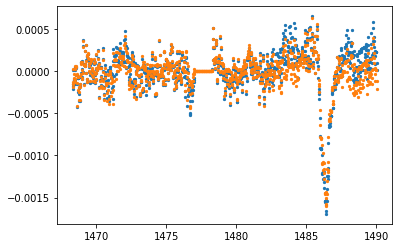

In [28]:
plt.scatter(data['TIME'],normalise_flux(data['PDCSAP_FLUX']),s=5)
plt.scatter(array['time'],array['flux'],s=5)